# Eye side prediction using YOLO

In [1]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

In [2]:

def show_classification_results(model, image_dir, image_numbers, conf=0.25, cols=5, figsize=(20, 10)):
    """
    Predicts 'left' or 'right' classification for multiple images and displays
    them with colored borders according to the predicted label.

    Args:
        model: Classification model with a .predict() or .predictor() method
        image_dir: directory containing input images
        image_numbers: list of image numbers (e.g., [1, 2, 3])
        conf: optional confidence threshold (used if model returns confidences)
        cols: number of columns in the subplot grid
        figsize: overall figure size
    """
    image_dir = Path(image_dir)
    rows = int(np.ceil(len(image_numbers) / cols))
    plt.figure(figsize=figsize)

    for i, num in enumerate(image_numbers):
        filename = f"{num:04d}.png"
        img_path = image_dir / filename

        # Load and preprocess image
        img = cv2.imread(str(img_path))
        if img is None:
            print(f"[Warning] Could not read {filename}")
            continue
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Get model prediction
        results = model.predict(source=str(img_path), conf=conf, verbose=False, show=False, save=False)

        # Extract label and (optionally) confidence
        if hasattr(results[0], "probs"):
            probs = results[0].probs.data.cpu().numpy()
            label_idx = np.argmax(probs)
            label = results[0].names[label_idx]
            confidence = probs[label_idx]
        else:
            label = results[0].names[int(results[0].probs.top1)]
            confidence = results[0].probs.top1conf.item()

        # Choose color based on label
        if label.lower() == "left":
            color = (0, 255, 0)  # Green
        elif label.lower() == "right":
            color = (255, 0, 0)  # Red
        else:
            color = (255, 255, 0)  # Yellow for unknown

        # Draw border
        border_thickness = 10
        img_with_border = cv2.copyMakeBorder(
            img_rgb,
            border_thickness,
            border_thickness,
            border_thickness,
            border_thickness,
            cv2.BORDER_CONSTANT,
            value=color,
        )

        # Add text label
        label_text = f"{label.upper()} ({confidence:.2f})"
        cv2.putText(
            img_with_border,
            label_text,
            (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX,
            1.2,
            (255, 255, 255),
            3,
            cv2.LINE_AA,
        )

        # Plot
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img_with_border)
        plt.title(filename)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

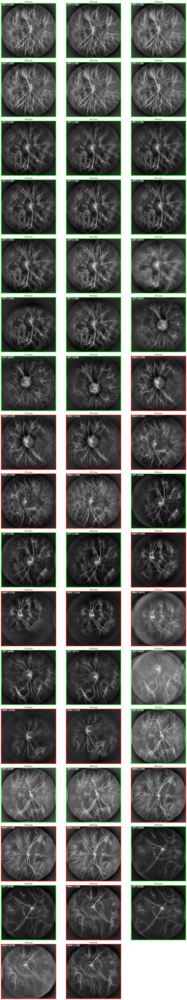

In [3]:
trained_model = YOLO("runs/train/eye_side_classification4/weights/best.pt")
show_classification_results(trained_model, "data/eye/train", range(500, 550), cols=3, figsize=(20, 100))